In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [3]:
def showit(Title="",image=None,size=10):
  w,h = image.shape[0],image.shape[1]
  aspect_ratio=w/h
  plt.figure(figsize=(size*aspect_ratio,size))
  plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
  plt.title(Title)
  plt.show()

In [4]:
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2023-04-13 05:55:39--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.142.74
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.142.74|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  5.12MB/s    in 15s     

2023-04-13 05:55:55 (1.88 MB/s) - ‘images.zip’ saved [29586716/29586716]



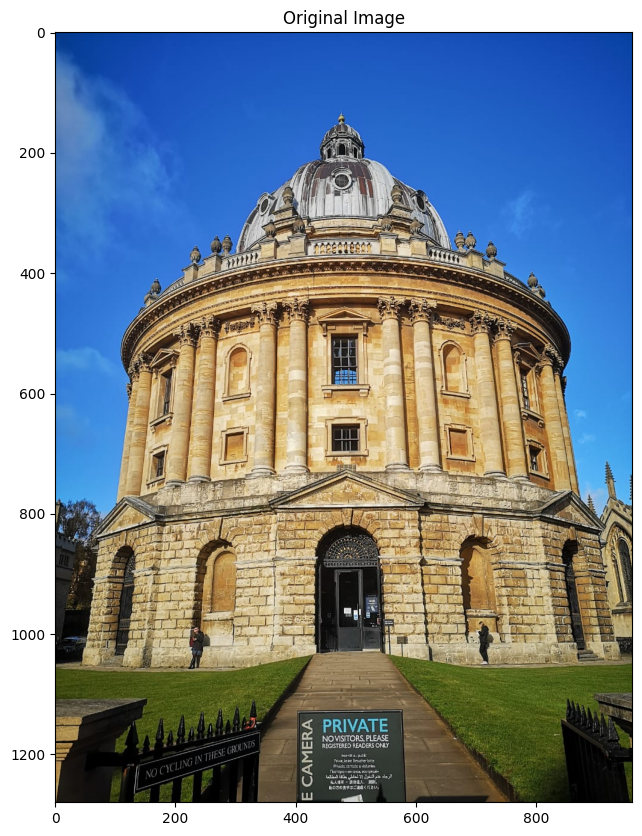

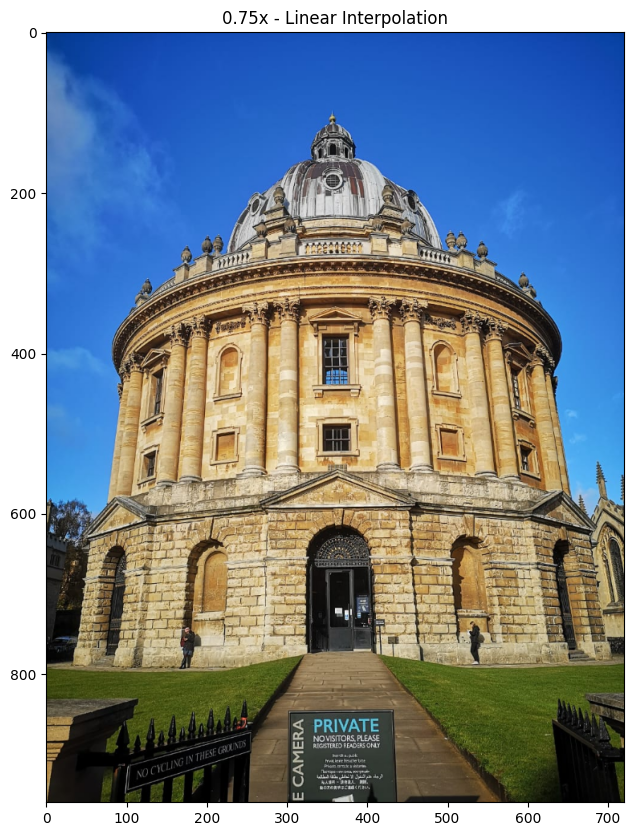

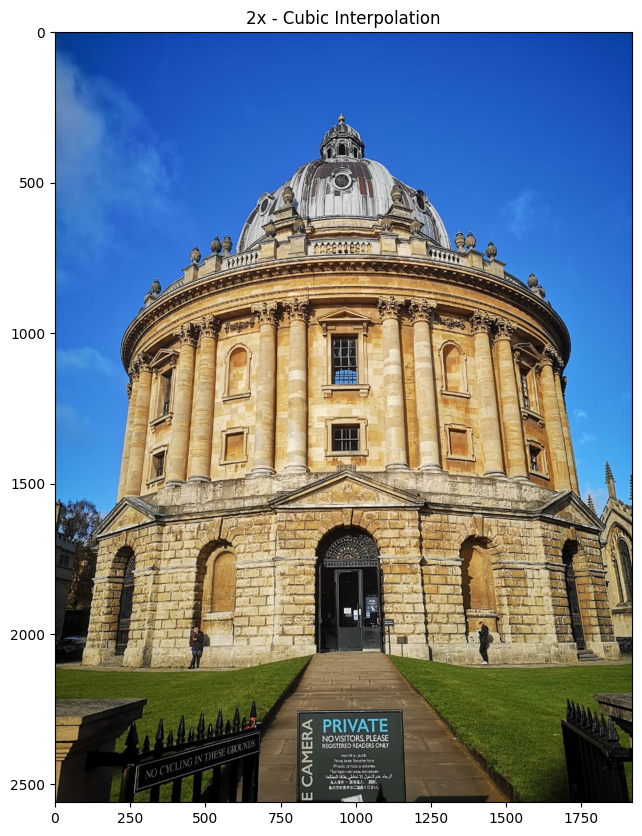

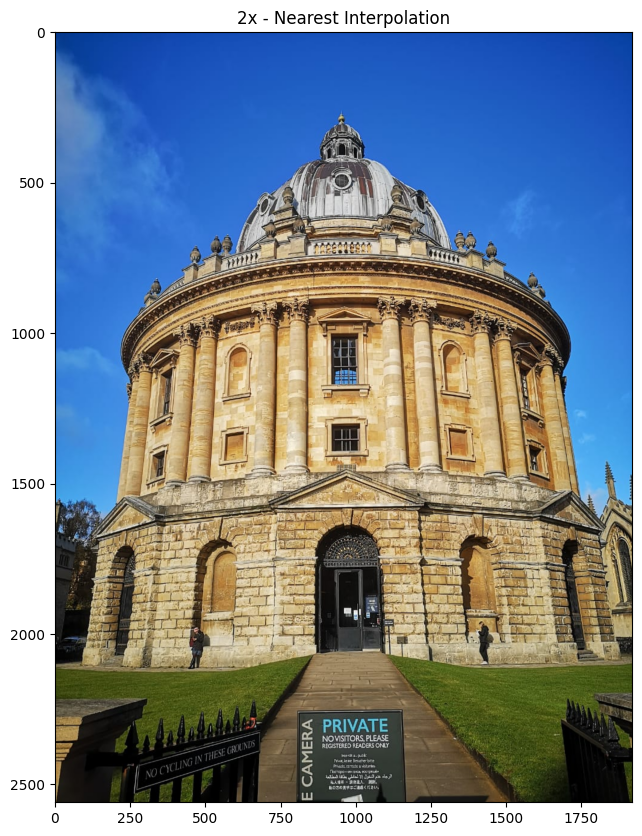

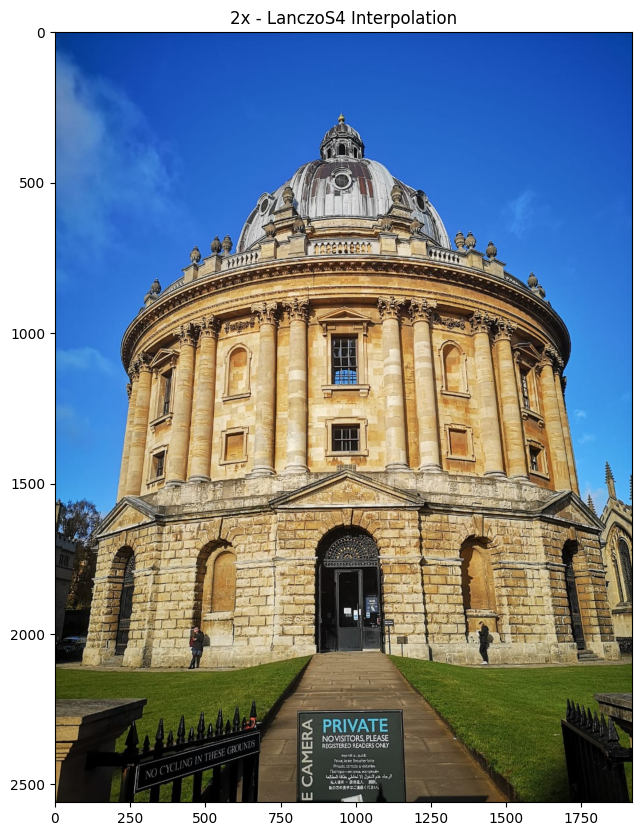

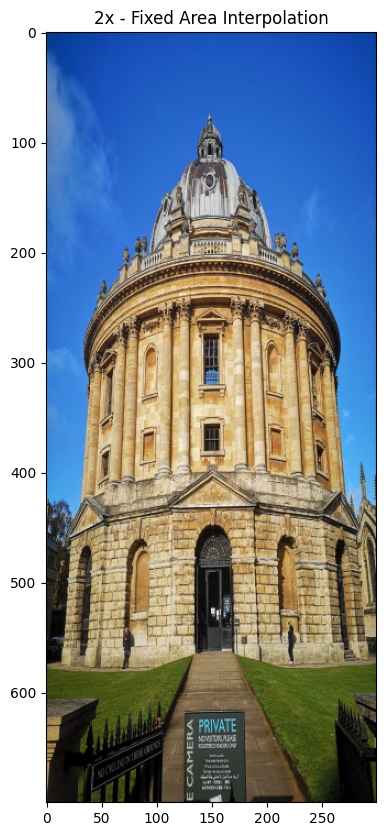

In [5]:
#if no interpolation is specified then inter linear is used by default.
#cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)
image = cv2.imread('images/oxfordlibrary.jpeg')
showit("Original Image",image)
image_scaled=cv2.resize(image,None,fx=0.75,fy=0.75)
showit("0.75x - Linear Interpolation",image_scaled)
image_scaled2=cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_CUBIC)
showit("2x - Cubic Interpolation",image_scaled2)
image_scaled3=cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_NEAREST)
showit("2x - Nearest Interpolation",image_scaled3)
image_scaled4=cv2.resize(image,None,fx=2,fy=2,interpolation=cv2.INTER_LANCZOS4)
showit("2x - LanczoS4 Interpolation",image_scaled4)
image_scaled5=cv2.resize(image,(300,700),interpolation=cv2.INTER_AREA)
showit("2x - Fixed Area Interpolation",image_scaled5)

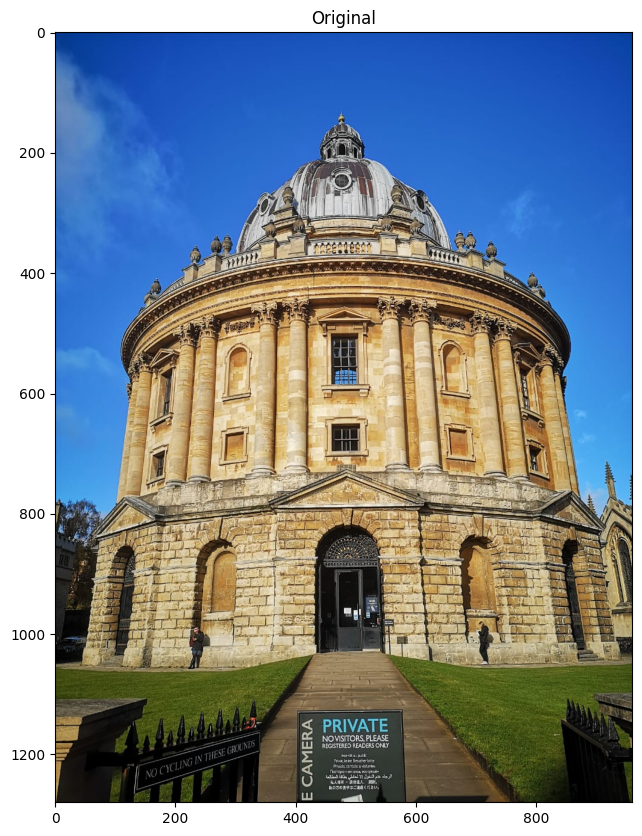

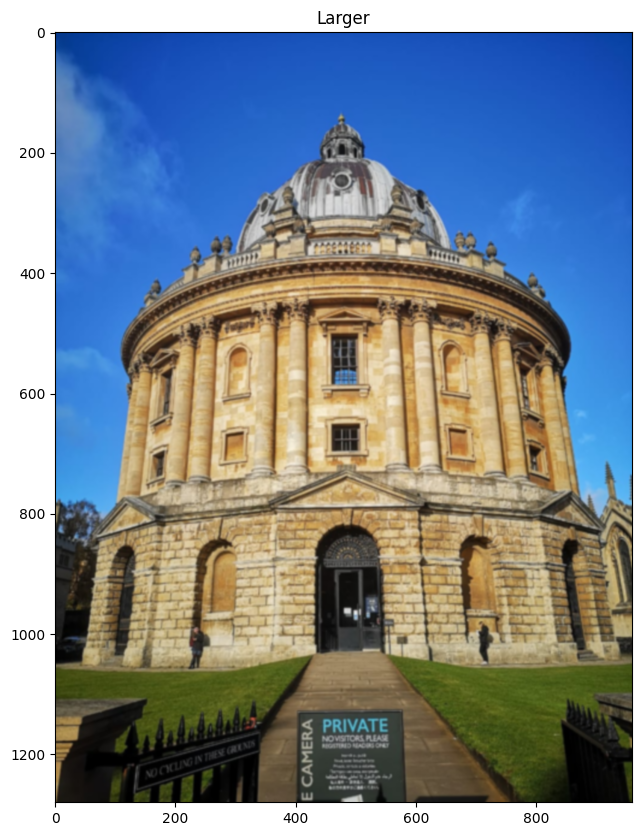

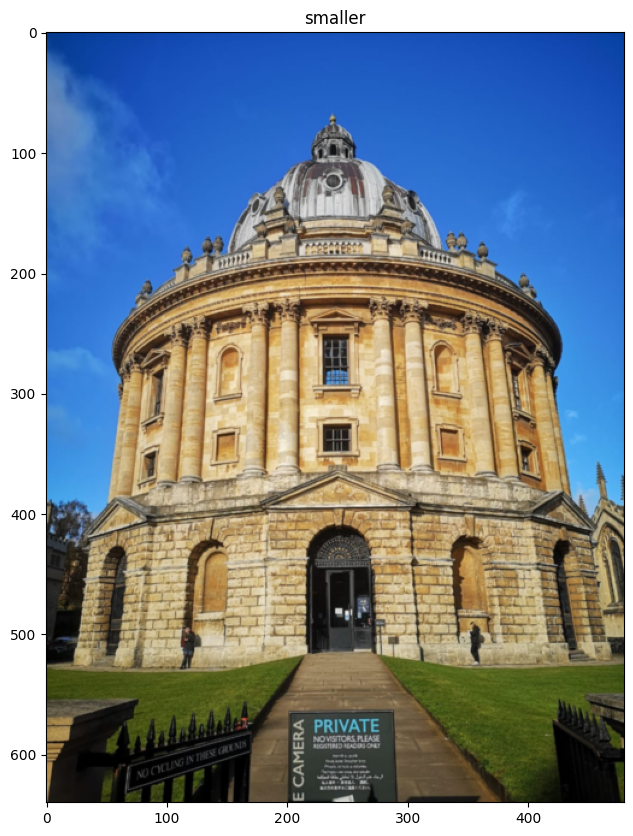

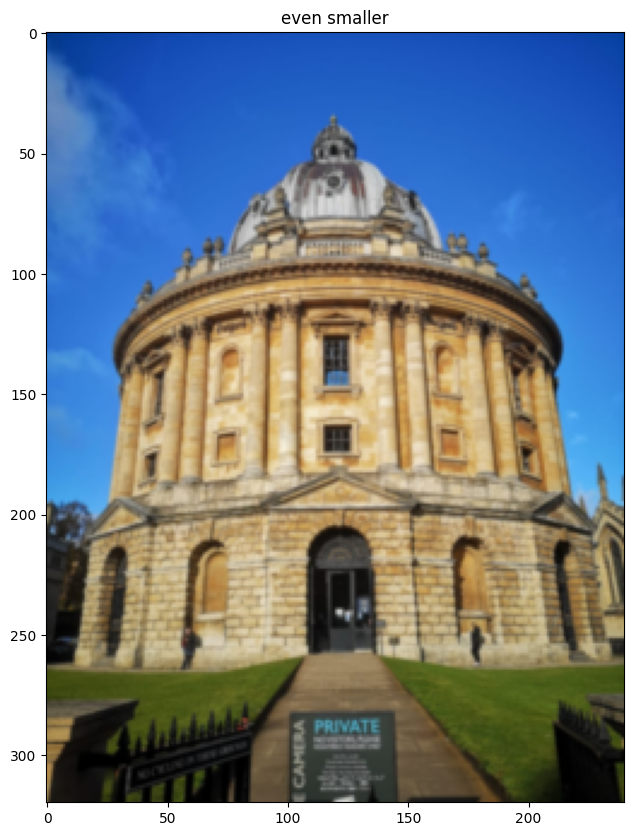

In [8]:
#image pyramids - basically the resolution 
image = cv2.imread('images/oxfordlibrary.jpeg')
smaller=cv2.pyrDown(image)
larger=cv2.pyrUp(smaller)
even_smaller=cv2.pyrDown(smaller)
showit("Original",image)
showit("Larger",larger)
showit("smaller",smaller)
showit("even smaller",even_smaller)

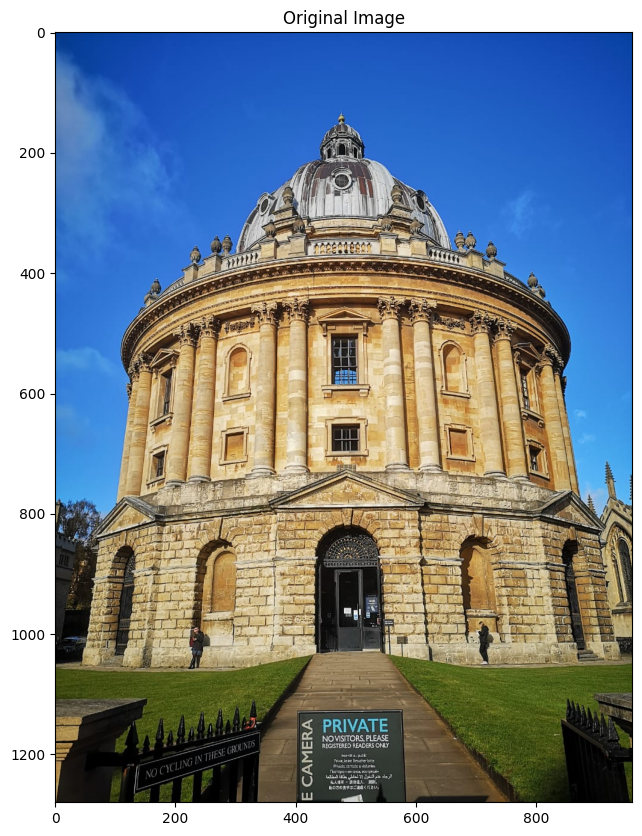

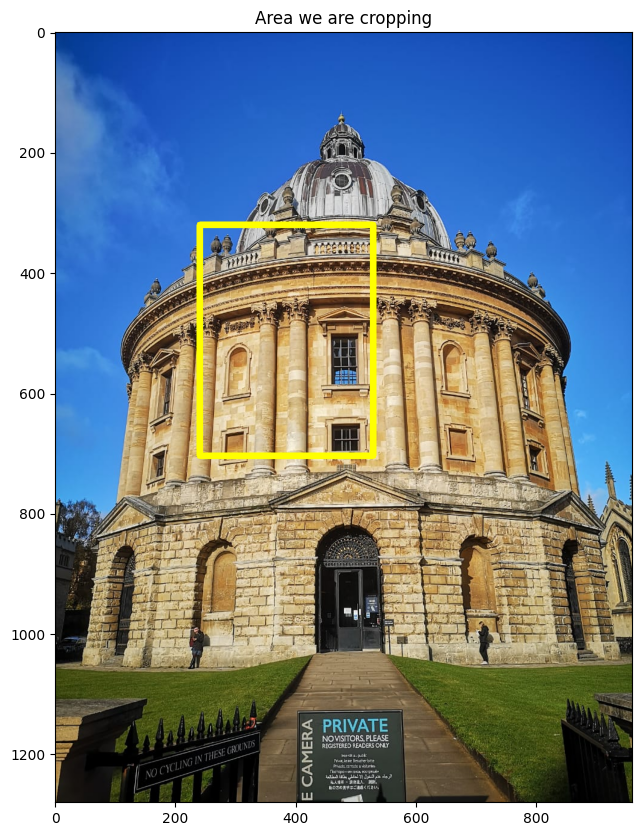

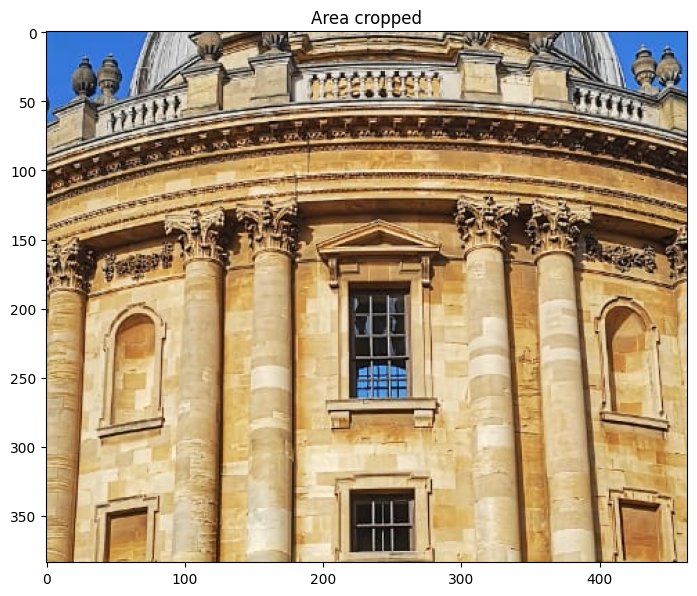

In [13]:
image = cv2.imread('images/oxfordlibrary.jpeg')
height, width = image.shape[:2]
start_r,start_c=int(height*0.25),int(width*0.25)
end_r,end_c=int(height*0.55),int(width*0.55)
cropped_image=image[start_r:end_r,start_c:end_r]
showit("Original Image",image)
copy3=image.copy()
cv2.rectangle(copy3,(start_c,start_r),(end_c,end_r),(0,255,255),10)
showit("Area we are cropping",copy3)
showit("Area cropped",cropped_image)
